# Categorization based on identity, positive, and coverage of template sequence

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from sklearn.metrics import mean_absolute_error, mean_squared_error
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)

In [2]:
from pathlib import Path
score_dir = Path('../../../../score/scop_cl_equal_globular100_identity95_coverage60')
plot_dir = score_dir / 'plot'
plot_dir.mkdir(exist_ok=True)
tmscore_path = score_dir / 'scop_cl_equal_globular100_identity95_coverage60_final.csv'
df = pd.read_csv(tmscore_path, index_col=0)
for c in ['identity(-misres)','positive(-misres)', 'coverage(-misres)', 'identity', 'positive', 'coverage']:
    df[c] = df[c] / df['seq_len']
df

,model,GDT_TS,GDT_HA,TMscore,target,template,seq_len,identity,positive,coverage,...,SF-PDBID,SF-PDBREG,SF-UNIID,SF-UNIREG,TP,CL,CF,SF,FA,Class
0,1AYZ_A_3OJ4_A_2_1,0.864,0.704,0.912,1AYZ_A,3OJ4_A_2,153,0.359,0.582,0.948,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
1,1AYZ_A_4L83_A_3_3,0.858,0.678,0.907,1AYZ_A,4L83_A_3,153,0.327,0.536,0.980,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
2,1AYZ_A_6TTU_D_1_5,0.851,0.678,0.898,1AYZ_A,6TTU_D_1,153,0.366,0.588,0.935,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
3,1AYZ_A_4GPR_A_1_1,0.842,0.688,0.872,1AYZ_A,4GPR_A_1,153,0.359,0.582,0.908,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
4,1AYZ_A_1TTE_A_3_5,0.657,0.423,0.787,1AYZ_A,1TTE_A_3,153,0.288,0.516,0.974,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14620,6SPF_T_3PYO_T_2_1,0.862,0.707,0.853,6SPF_T,3PYO_T_2,94,0.447,0.596,0.936,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14621,6SPF_T_3J7Y_U_3_1,0.614,0.444,0.598,6SPF_T,3J7Y_U_3,94,0.287,0.489,0.979,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14622,6SPF_T_1PNU_R_2_4,0.790,0.590,0.775,6SPF_T,1PNU_R_2,94,0.394,0.574,0.926,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14623,6SPF_T_5O60_U_3_4,0.832,0.692,0.840,6SPF_T,5O60_U_3,94,0.383,0.521,0.926,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta


In [3]:
template_df = df.groupby(['target', 'template']).head(1)
template_df

,model,GDT_TS,GDT_HA,TMscore,target,template,seq_len,identity,positive,coverage,...,SF-PDBID,SF-PDBREG,SF-UNIID,SF-UNIREG,TP,CL,CF,SF,FA,Class
0,1AYZ_A_3OJ4_A_2_1,0.864,0.704,0.912,1AYZ_A,3OJ4_A_2,153,0.359,0.582,0.948,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
1,1AYZ_A_4L83_A_3_3,0.858,0.678,0.907,1AYZ_A,4L83_A_3,153,0.327,0.536,0.980,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
2,1AYZ_A_6TTU_D_1_5,0.851,0.678,0.898,1AYZ_A,6TTU_D_1,153,0.366,0.588,0.935,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
3,1AYZ_A_4GPR_A_1_1,0.842,0.688,0.872,1AYZ_A,4GPR_A_1,153,0.359,0.582,0.908,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
4,1AYZ_A_1TTE_A_3_5,0.657,0.423,0.787,1AYZ_A,1TTE_A_3,153,0.288,0.516,0.974,...,1AYZ,A:2-154,P06104,2-154,1,1000003,2000386,3000570,4001046,alpha + beta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14592,6SPF_T_2GYA_R_1_4,0.734,0.516,0.734,6SPF_T,2GYA_R_1,94,0.521,0.681,0.947,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14593,6SPF_T_6DZI_U_3_1,0.832,0.654,0.834,6SPF_T,6DZI_U_3,94,0.383,0.521,0.926,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14596,6SPF_T_3FIN_X_2_2,0.668,0.489,0.654,6SPF_T,3FIN_X_2,94,0.447,0.596,0.936,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta
14597,6SPF_T_5A9Z_AU_2_3,0.785,0.590,0.799,6SPF_T,5A9Z_AU_2,94,0.447,0.596,0.936,...,6SPF,T:1-94,E2RXT1,1-94,1,1000003,2000195,3000210,4000943,alpha + beta


## identity

In [4]:
# swarm plot of the identity for each target
data = template_df
g = sns.factorplot(data=data, y='identity', col='target', kind='swarm', col_wrap=5)
g.set(ylim=(0, 1))
output_path = plot_dir / 'template_identity_swarmplot.png'
plt.savefig(output_path)

In [5]:
max_identity = template_df.groupby('target').apply(lambda x: x['identity'].max())
max_identity = pd.DataFrame(max_identity).rename({0: 'max identity'}, axis=1)
max_identity

,max identity
target,
1AYZ_A,0.680
1AZ5_A,0.879
1BQU_A,0.939
1DE4_A,0.393
1EA9_C,0.628
...,...
6K9F_B,0.322
6KNA_A,0.763
6KWQ_A,0.922


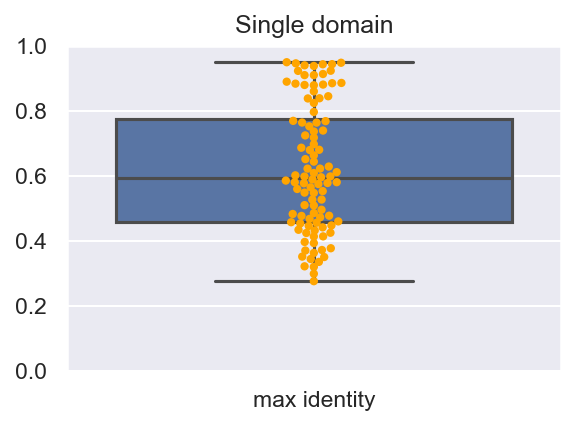

In [6]:
plt.figure(figsize=(4, 3))
sns.boxplot(data=max_identity)
sns.swarmplot(data=max_identity, color='orange', size=4)
plt.ylim([0, 1])
plt.title('Single domain')
plt.tight_layout()
plt.savefig(plot_dir / 'max_identity_swarmplot.png')
plt.show()

In [7]:
print('0.8 <= identity:', max_identity[max_identity > 0.8].count())
print('0.5<= identity < 0.8:', max_identity[(0.5 <= max_identity) & (max_identity < 0.8)].count())
print('identity < 0.5:', max_identity[max_identity < 0.5].count())

0.8 <= identity: max identity    24
dtype: int64
0.5<= identity < 0.8: max identity    42
dtype: int64
identity < 0.5: max identity    34
dtype: int64


In [8]:
def categorize_by_relative_distribution(group, label='identity', dif_thre=0.1, top_percent=0.2):
    identity_sorted = list(group[label].sort_values())
    max_identity = identity_sorted[-1]
    second_identity = identity_sorted[-2]
    n_ten_percent = int(top_percent * len(group))
    ten_percent_identity = identity_sorted[-n_ten_percent]
    dif = max_identity - second_identity
    if dif > dif_thre:
        return 'top'
    elif max_identity - ten_percent_identity > dif_thre:
        return 'multi top' 
    else:
        return 'other'

In [9]:
identity_category = template_df.groupby('target').apply(categorize_by_relative_distribution)
identity_category = pd.DataFrame(identity_category).rename({0: 'identity_category'}, axis=1)
identity_category

,identity_category
target,
1AYZ_A,multi top
1AZ5_A,multi top
1BQU_A,multi top
1DE4_A,other
1EA9_C,other
...,...
6K9F_B,other
6KNA_A,other
6KWQ_A,top


In [10]:
identity_category.value_counts()

identity_category
other                50
multi top            41
top                   9
dtype: int64

multi top


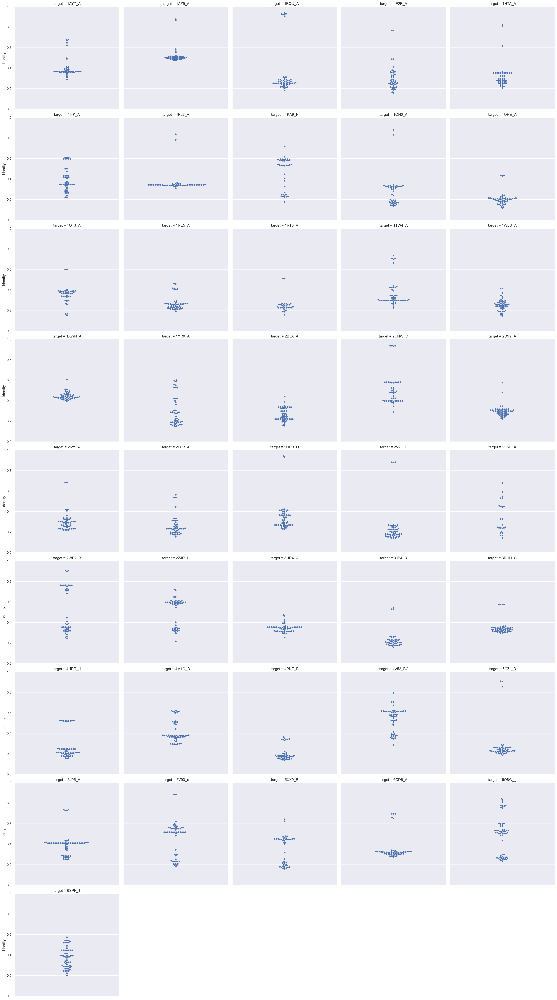

other


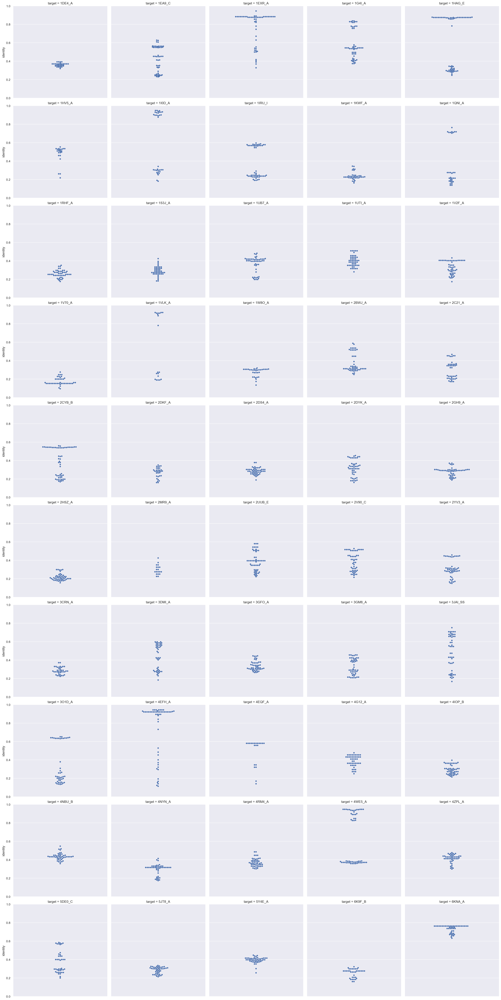

top


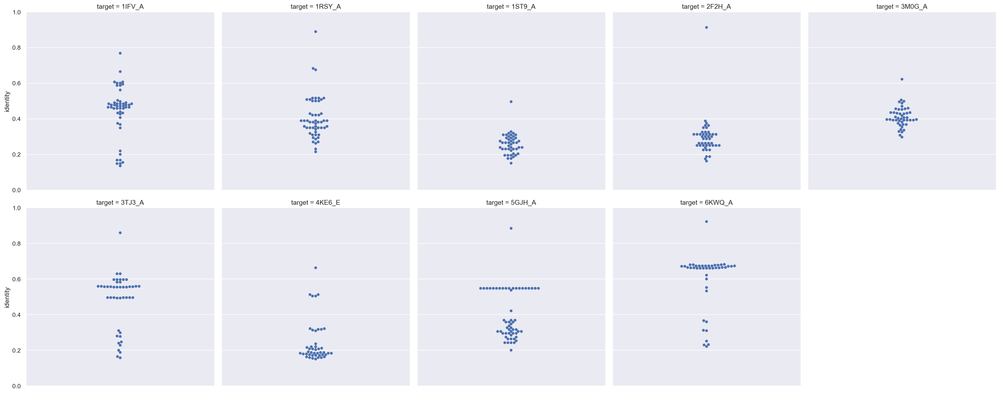

In [11]:
template_identity_df = pd.merge(template_df, identity_category, left_on='target', right_index=True)

for name, group in template_identity_df.groupby('identity_category'):
    print(name)
    g = sns.factorplot(data=group, y='identity', col='target', kind='swarm', col_wrap=5)
    g.set(ylim=(0, 1))
    output_path = plot_dir / ('template_identity_' + name + '_swarmplot.png')
    plt.savefig(output_path)
    plt.show()

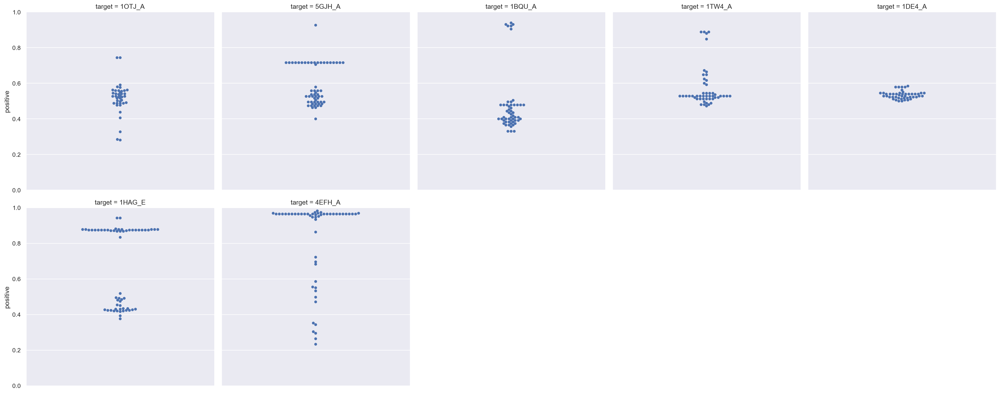

In [12]:
target_list = ['1OTJ_A', '5GJH_A', '1BQU_A', '1TW4_A', '1DE4_A', '1HAG_E', '4EFH_A']
data = template_df.query('target in @target_list')
g = sns.factorplot(data=data, y='positive', col='target', kind='swarm', col_wrap=5, col_order=target_list)
g.set(ylim=(0, 1))

## positive

In [13]:
# swarm plot of the identity for each target
data = template_df
g = sns.factorplot(data=data, y='positive', col='target', kind='swarm', col_wrap=5)
g.set(ylim=(0, 1))
output_path = plot_dir / 'template_positive_swarmplot.png'
plt.savefig(output_path)

In [14]:
positive_category = template_df.groupby('target').apply(lambda x: categorize_by_relative_distribution(x, label='positive'))
positive_category = pd.DataFrame(positive_category).rename({0: 'positive_category'}, axis=1)
positive_category

,positive_category
target,
1AYZ_A,multi top
1AZ5_A,multi top
1BQU_A,multi top
1DE4_A,other
1EA9_C,other
...,...
6K9F_B,other
6KNA_A,other
6KWQ_A,top


In [15]:
positive_category.value_counts()

positive_category
other                51
multi top            43
top                   6
dtype: int64

multi top


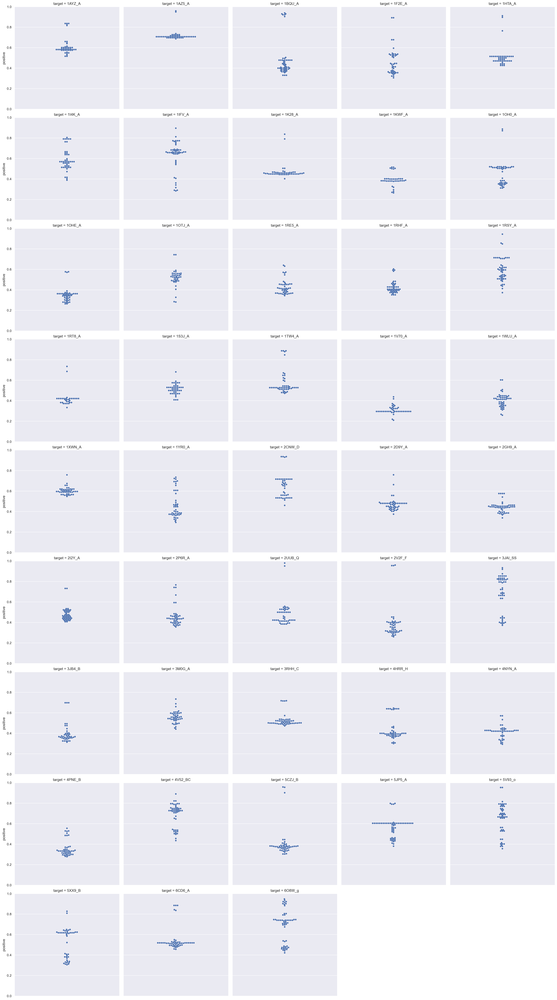

other


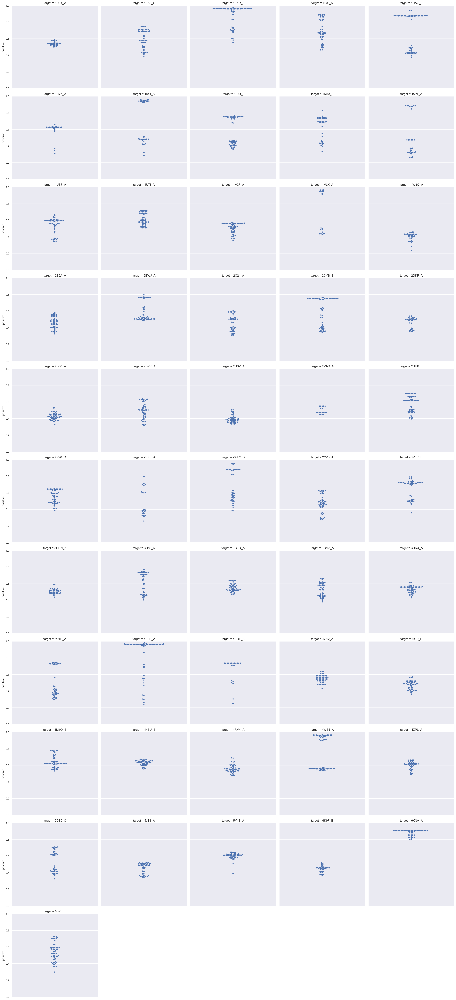

top


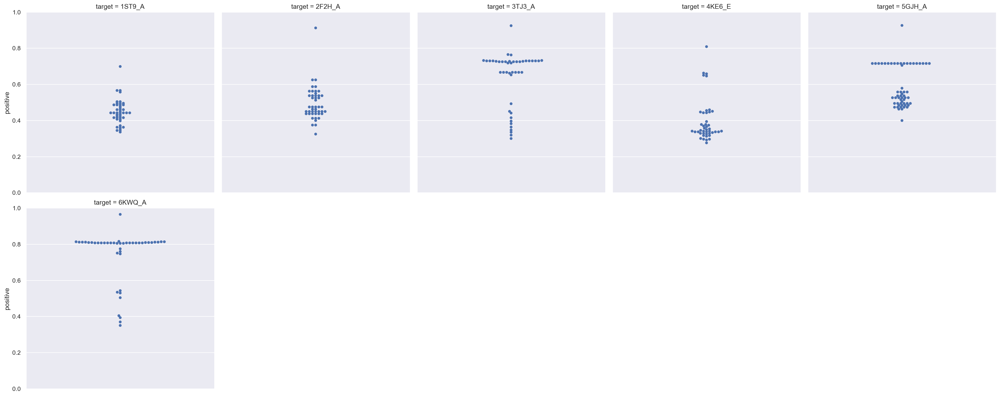

In [16]:
template_positive_df = pd.merge(template_df, positive_category, left_on='target', right_index=True)

for name, group in template_positive_df.groupby('positive_category'):
    print(name)
    g = sns.factorplot(data=group, y='positive', col='target', kind='swarm', col_wrap=5)
    g.set(ylim=(0, 1))
    output_path = plot_dir / ('template_positive_' + name + '_swarmplot.png')
    plt.savefig(output_path)
    plt.show()

In [17]:
max_positive= template_df.groupby('target').apply(lambda x: x['positive'].max())
max_positive = pd.DataFrame(max_positive).rename({0: 'max positive'}, axis=1)
max_positive

,max positive
target,
1AYZ_A,0.837
1AZ5_A,0.960
1BQU_A,0.939
1DE4_A,0.584
1EA9_C,0.746
...,...
6K9F_B,0.517
6KNA_A,0.908
6KWQ_A,0.965


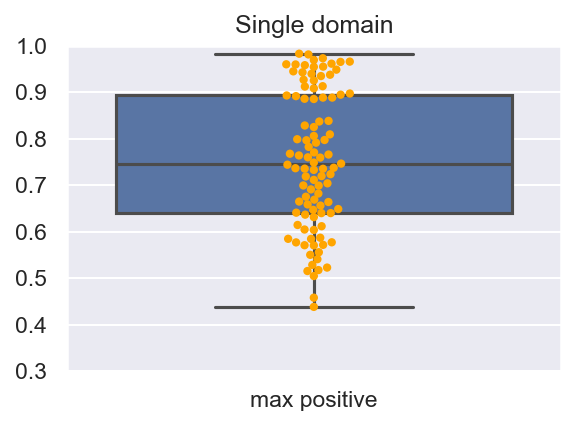

In [18]:
plt.figure(figsize=(4, 3))
data = max_positive
sns.boxplot(data=data)
sns.swarmplot(data=data, color='orange', size=4)
plt.ylim([0.3, 1])
plt.title('Single domain')
plt.tight_layout()
plt.savefig(plot_dir / 'max_positive_swarmplot.png')
plt.show()

In [19]:
data = max_positive
print('0.8 <= identity:', data[data > 0.8].count())
print('0.6<= identity < 0.8:', data[(0.6 <= data) & (data < 0.8)].count())
print('identity < 0.6:', data[data < 0.6].count())

0.8 <= identity: max positive    37
dtype: int64
0.6<= identity < 0.8: max positive    45
dtype: int64
identity < 0.6: max positive    18
dtype: int64


In [20]:
data = max_positive
print('0.85 <= identity:', data[data > 0.85].count())
print('0.7<= identity < 0.85:', data[(0.7 <= data) & (data < 0.85)].count())
print('identity < 0.7:', data[data < 0.7].count())

0.85 <= identity: max positive    31
dtype: int64
0.7<= identity < 0.85: max positive    30
dtype: int64
identity < 0.7: max positive    39
dtype: int64


## coverage

In [21]:
# scatter plot of the coverage and gdtts for each target
data = df
g = sns.relplot(data=data, y='coverage', x='GDT_TS', col='target', kind='scatter', col_wrap=5)
g.set(ylim=(0, 1))
plt.tight_layout()
output_path = plot_dir / 'coverage_gdtts_scatter.png'
plt.savefig(output_path)